# Object: phishing emails detection using sentiment analysis

Veri setimiz, toplamda 50 bin e-posta örneğinden oluşmaktadır. Bu not defterinde, öncelikle veri setimizi detaylı bir şekilde inceleyeceğiz. Daha sonra, duygu analizi tahmini gerçekleştirecek ve unsupervised bir yöntem olan K-means ile kümeleme işlemini gerçekleştireceğiz. Son olarak, verilerimizi kullanarak bir Multilayer Perceptron modeli eğiteceğiz ve sonuçları değerlendireceğiz.

https://www.kaggle.com/datasets/wcukierski/enron-email-dataset/data

In [1]:
# import needed libraries

import numpy as np  # Çok boyutlu diziler ve matris işlemleri için kullanılır.
import string  # Metin verilerinde noktalama işaretleri ve benzeri işlemler için kullanılır.
import pandas as pd  # Veri işleme ve analizi için kullanılır.
import seaborn as sns  # Çekici ve bilgi verici istatistiksel grafikler çizmek için kullanılır.
import matplotlib.pyplot as plt  # Uygulamalarda grafik çizimleri yerleştirmek için kullanılır.
%matplotlib inline  # Matplotlib çıktılarının doğrudan not defterinde görüntülenmesini sağlar.

sns.set_style('darkgrid')  # Grafikler için koyu renkli bir ızgara stili ayarlanır.
import email  # E-posta mesajlarını işlemek ve analiz etmek için kullanılır.
import re  # Dize arama ve düzenleme işlemleri için düzenli ifadeler modülü.
from datetime import datetime  # Tarih ve saat bilgilerini işlemek için kullanılır.
from dateutil import tz  # Saat dilimleriyle ilgili işlemler için kullanılır.
import networkx as nx  # Ağ yapıları ve graf teorisi işlemleri için kullanılır.
import nltk  # Doğal dil işleme (NLP) görevleri için kullanılır.
import wordcloud  # Kelime bulutları oluşturmak için kullanılır.
import plotly.express as px  # İnteraktif görselleştirme ve grafikler için kullanılır.
from plotly import graph_objects as go  # Daha detaylı ve özelleştirilebilir grafikler oluşturmak için kullanılır.

# Veri Ön İşleme (Data Preprocessing)
from sklearn.preprocessing import StandardScaler  # Özelliklerin ölçeklendirilmesi ve standart hale getirilmesi için kullanılır.
from sklearn.preprocessing import normalize  # Verilerin normalize edilmesi için kullanılır.

# Makine Öğrenimi ve NLP Kütüphaneleri
from sklearn.feature_extraction.text import TfidfVectorizer  # Metin verilerinin TF-IDF matrisine dönüştürülmesi için kullanılır.
from sklearn.cluster import KMeans  # K-means algoritmasıyla kümeleme yapmak için kullanılır.
from sklearn.neural_network import MLPClassifier  # Çok katmanlı yapay sinir ağı (Multilayer Perceptron) modeli için kullanılır.
from sklearn.decomposition import TruncatedSVD  # Boyut indirgeme işlemleri için kullanılır.
from sklearn import metrics  # Performans değerlendirme metrikleri için kullanılır.
import scipy as sp  # Bilimsel hesaplamalar için güçlü bir kütüphane.
from nltk.tokenize import word_tokenize  # Metni kelimelere ayırmak (tokenization) için kullanılır.
from nltk.stem import PorterStemmer, WordNetLemmatizer  # Kelime kökleri ve lemmatizasyon işlemleri için kullanılır.

# Duygu Analizi (Sentiment Analysis)
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer  # Cümlelerin duygu puanlarını analiz etmek için kullanılır.
from nrclex import NRCLex  # Metinlerdeki duygusal ifadeleri ve kategorileri analiz etmek için kullanılır.


In [2]:
# Veri setini yükle

df = pd.read_csv("emails.csv")

In [3]:
df.head()

,file,message
0,allen-p/_sent_mail/1.,Message-ID: <18782981.1075855378110.JavaMail.e...
1,allen-p/_sent_mail/10.,Message-ID: <15464986.1075855378456.JavaMail.e...
2,allen-p/_sent_mail/100.,Message-ID: <24216240.1075855687451.JavaMail.e...
3,allen-p/_sent_mail/1000.,Message-ID: <13505866.1075863688222.JavaMail.e...
4,allen-p/_sent_mail/1001.,Message-ID: <30922949.1075863688243.JavaMail.e...


 ## Data processing

**Bu veri ön işleme süreci, verilen e-posta veri seti üzerinde yapılan çeşitli temizleme, dönüştürme ve analitik adımları içeriyor. İşte yapılan işlemler ve onların amacı hakkında bir özet:**

    1. Veri Setinin Genel İncelemesi
df.info() ile veri setinin yapısı, sütun adları, eksik değerler ve veri tipleri incelendi.
Bu, veri setindeki eksiklikleri ve hatalı veri türlerini belirlemek için ilk adımdı.
    
    2. E-posta Başlık ve Gövdesinin Ayrıştırılması
E-posta mesajlarından başlık bilgileri (Date, From, To, Subject, vb.) ayrıştırıldı.
Amaç: Her bir e-posta mesajını daha yapılandırılmış bir şekilde temsil etmek ve analiz edilebilir hale getirmek.
Gövde (Body) içeriği ayrıca ayrıştırılarak, e-postaların metinsel analiz için hazır hale getirilmesi sağlandı.

    3. Çalışan Adlarının Çıkarılması
file sütunundan çalışanların adları ayrıştırılarak yeni bir Employee sütunu oluşturuldu.
Amaç: Çalışan bazlı analiz yapabilmek (örneğin, en çok e-posta gönderen çalışanları bulmak).
 
    4. Gereksiz Verilerin Çıkarılması
file ve message gibi analiz için gereksiz olan sütunlar veri setinden çıkarıldı.
Ayrıca, eksik değer içeren satırlar kaldırılarak veri seti temizlendi.

    5. Tarih Formatının Düzenlenmesi
Date sütunundaki tarih bilgileri string formatından datetime formatına dönüştürüldü.
Tarih bilgisinden yıl çıkarılarak bir Year sütunu eklendi.
Amaç: Yıl bazında analizler yapmak ve trendleri gözlemlemek.

    6. Metin Sütunlarının Temizlenmesi
X-From ve X-To sütunlarında metin temizleme işlemleri uygulandı (örneğin, e-posta adreslerinden gereksiz karakterlerin çıkarılması).
Bu işlem, daha tutarlı bir veri seti oluşturmak için önemliydi.

    7. Veri Keşfi ve Analiz
Çalışan ve yıl bazında veri analizi yapıldı.
Çalışanların gönderdiği e-posta sayılarına göre sıralamalar (Employee.value_counts()).
Yıllık bazda e-posta gönderimlerinin dağılımı incelendi (Year.value_counts()).
Veri özetleme işlemleriyle (df.describe() ve df.boxplot) veri setindeki dağılımlar, anormallikler ve genel istatistikler analiz edildi.

    8. Eksik Değerlerin Kontrolü
df.isnull().sum() ile eksik değer kontrolü yapıldı. Tüm sütunların eksik değerlerden temizlenmiş olduğu doğrulandı.

**Sonuç**

    Bu veri ön işleme süreci, ham veri setini analiz edilebilir ve anlamlı hale getirmek için tüm gerekli adımları kapsıyor. Bu süreç sonunda, çalışan bazlı analizler, yıllık trendler, duygu analizi veya diğer NLP modelleri için kullanıma hazır bir veri seti elde edilmiştir.

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   file     50000 non-null  object
 1   message  50000 non-null  object
dtypes: object(2)
memory usage: 781.4+ KB


In [5]:
# Bu fonksiyon, e-posta mesajlarından belirtilen başlık veya gövde alanlarını ayıklamak için kullanılır.
# Parametreler:
# - field: Ayıklanacak e-posta alanı (örneğin, "From", "Subject", "Date").
# - msg: E-posta mesajlarını içeren bir veri yapısı (örneğin bir dictionary).
# İşleyiş:
# 1. Boş bir liste (elst) oluşturulur, bu liste ayıklanan alanları depolayacaktır.
# 2. msg.items() ile her bir e-posta mesajı döngüye alınır.
# 3. Her mesaj, `email.message_from_string()` fonksiyonu ile e-posta nesnesine dönüştürülür.
# 4. Belirtilen alan (field) e-posta nesnesinden alınır ve listeye eklenir.
# 5. Fonksiyon, alanları içeren listeyi döndürür.
# Bu işlem, e-posta mesajlarını daha düzenli ve analiz edilebilir hale getirir.

def extractmailitems(field, msg):
    elst = []
    
    for i, message in (msg.items()):
        e = email.message_from_string(message)
        elst.append(e.get(field))
       
    return elst


In [6]:
# 'columns' listesi, e-postalardan ayıklanacak başlık veya metadata alanlarını tanımlar (örn: 'Date', 'From').
# Her bir kolon adı için `extractmailitems` fonksiyonu çalıştırılarak bu alanlar veri çerçevesine eklenir.

columns = ['Date', 'From', 'To', 'Subject', 'X-From', 'X-To', 'X-Folder', 'X-Origin', 'X-Filename']
for i in columns:
    df[i] = extractmailitems(i, df['message'])

In [7]:
# E-postanın metin kısmını (gövdesini) almak için `email.message_from_string()` kullanılır.
# `get_payload()` metodu ile e-postanın asıl içeriği elde edilip bir listeye eklenir.
# Tüm gövdeler işlendikten sonra liste veri çerçevesine 'Body' kolonu olarak eklenir.

def body(col):
    bodycolumn = []
    for message in col.values:
        e = email.message_from_string(message)
        bodycolumn.append(e.get_payload())
 
    return bodycolumn
df['Body'] = body(df['message'])

In [8]:
# 'file' kolonundaki her bir değerden çalışan adı elde edilir (örneğin, 'beck-s/...' -> 'beck-s').
# Dosya yollarını '/' ile ayırarak ilk kısmı alır ve bu değerler listeye eklenir.
# Sonuç olarak çalışan isimleri 'Employee' kolonuna eklenir.

def employees(files):
    employees = []
    for i, employee in files.items():
        employee = employee.split('/')[0]
        employees.append(employee)
    return employees
df['Employee'] = employees(df['file'])

In [9]:
df.sample(5)

,file,message,Date,From,To,Subject,X-From,X-To,X-Folder,X-Origin,X-Filename,Body,Employee
15967,bass-e/notes_inbox/500.,Message-ID: <24415173.1075854679073.JavaMail.e...,"Mon, 13 Nov 2000 02:27:00 -0800 (PST)",noreply@ccomad3.uu.commissioner.com,None,Commissioner.COM E-Reports for Big E 11/13/00,"""Commissioner.COM"" <noreply@ccomad3.uu.commiss...","undisclosed-recipients:,",\Eric_Bass_Dec2000\Notes Folders\Notes inbox,Bass-E,ebass.nsf,[IMAGE]\n\n\nFantasy Basketball is here...and ...,bass-e
25211,beck-s/delainey__dave/19.,Message-ID: <15385110.1075855819327.JavaMail.e...,"Tue, 18 Apr 2000 01:55:00 -0700 (PDT)",kay.chapman@enron.com,"rob.milnthorp@enron.com, max.yzaguirre@enron.c...",Meetings,Kay Chapman,"Rob Milnthorp, Max Yzaguirre, Janet R Dietrich...","\Sally_Beck_Dec2000\Notes Folders\Delainey, dave",Beck-S,sbeck.nsf,"Guys, currently we have two meetings a week be...",beck-s
30047,beck-s/office_of_the_chair/4.,Message-ID: <7087891.1075849856216.JavaMail.ev...,"Mon, 9 Apr 2001 03:13:00 -0700 (PDT)",enron.announcements@enron.com,enw-employees_houston@enron.com,Net Works Floor Meetings - DATES AND LOCATIONS...,Enron Announcements,ENW-Employees_Houston,\Sally_Beck_Nov2001\Notes Folders\Office of th...,BECK-S,sbeck.nsf,We will be holding floor meetings on the follo...,beck-s
44585,campbell-l/inbox/701.,Message-ID: <4639882.1075852935010.JavaMail.ev...,"Mon, 23 Jul 2001 05:53:46 -0700 (PDT)",sbarrett@nyiso.com,tie_list_server@nyiso.com,August Deficiency Auction - Rescheduled,sbarrett@nyiso.com,TIE_List_Server@nyiso.com,"\LCAMPBEL (Non-Privileged)\Campbell, Larry F.\...",Campbell-L,LCAMPBEL (Non-Privileged).pst,\nsbarrett@nyiso.com writes to the NYISO_TECH_...,campbell-l
27365,beck-s/discussion_threads/4105.,Message-ID: <14568761.1075856042940.JavaMail.e...,"Tue, 3 Apr 2001 02:52:00 -0700 (PDT)",sally.beck@enron.com,patti.thompson@enron.com,Enron's 2001 Goals,Sally Beck,Patti Thompson,\Sally_Beck_Jun2001\Notes Folders\Discussion t...,Beck-S,sbeck.nsf,Can you print this for me? Thanks. \n--------...,beck-s


In [10]:
# 'file' ve 'message' sütunları, analiz için doğrudan gerekli olmayan veriler içerdiği için kaldırılır.
# `inplace=True` parametresi, orijinal veri çerçevesini doğrudan değiştirmek için kullanılır.
df.drop(columns = ['file', 'message'], inplace=True)

# Veri çerçevesinde eksik veya boş hücreler varsa bunları satır bazında (axis=0) kaldırır.
# Bu işlem, eksik veri kaynaklı analiz hatalarını önlemek için yapılır.
df.dropna(axis = 0, inplace=True)

# Veri çerçevesinden rastgele 5 örnek satır seçip görüntüler, böylece yapılan işlemlerin etkisini kontrol edebiliriz.
df.sample(5)

,Date,From,To,Subject,X-From,X-To,X-Folder,X-Origin,X-Filename,Body,Employee
39498,"Fri, 18 Jan 2002 07:42:54 -0800 (PST)",rick.buy@enron.com,louise.kitchen@enron.com,Netco People,"Buy, Rick </O=ENRON/OU=NA/CN=RECIPIENTS/CN=RBUY>","Kitchen, Louise </O=ENRON/OU=NA/CN=RECIPIENTS/...",\rbuy\Sent Items,BUY-R,richard buy 1-30-02..pst,Louise- We need to get Netco people and UBS of...,buy-r
16880,"Tue, 10 Oct 2000 02:26:00 -0700 (PDT)",eric.bass@enron.com,nick.hiemstra@enron.com,Re: GAME @ 9 on Wed,Eric Bass,Nick Hiemstra,\Eric_Bass_Dec2000\Notes Folders\Sent,Bass-E,ebass.nsf,"who, the aggies, longhorns, or heat?\n\n\n\n\n...",bass-e
30423,"Thu, 15 Feb 2001 12:18:00 -0800 (PST)",lexi.elliott@enron.com,sally.beck@enron.com,OU - March 6,Lexi Elliott,Sally Beck,\Sally_Beck_Nov2001\Notes Folders\Recruiting,BECK-S,sbeck.nsf,Sally:\n\nI just received a reminder from Ted ...,beck-s
7348,"Fri, 30 Jun 2000 06:22:00 -0700 (PDT)",john.arnold@enron.com,slist@campbell.com,Re: FW: trading,John Arnold,Steve List <slist@Campbell.com> @ ENRON,\John_Arnold_Dec2000\Notes Folders\Sent,Arnold-J,Jarnold.nsf,Steve:\nGood hearing from you. Hope all is go...,arnold-j
46952,"Mon, 22 Oct 2001 22:06:52 -0700 (PDT)",damonmisti@aol.com,btusux@football.fantasy.sportsline.com,OFFICIALLY TUESDAY MORN!,Damonmisti@aol.com@ENRON,btusux@football.fantasy.sportsline.com,"\MCARSON2 (Non-Privileged)\Carson, Mike\Delete...",Carson-M,MCARSON2 (Non-Privileged).pst,to all of you early traders.... \nDropping Has...,carson-m


In [11]:
# [:20] kısmı ise yalnızca en çok kayıt bulunan ilk 20 çalışanı görüntülemek için kullanılır.
df.Employee.value_counts()[:20]

beck-s        11555
bass-e         7638
campbell-l     6085
arnold-j       4762
allen-p        2971
baughman-d     2638
buy-r          2280
blair-l        2233
cash-m         1999
carson-m       1327
brawner-s       923
badeer-r        796
arora-h         628
benson-r        594
bailey-s        455
Name: Employee, dtype: int64

In [12]:
# Tarih formatını ve türünü string'den tarih (date) nesnesine dönüştürüyoruz.
df['Date'] = pd.to_datetime(df['Date'], utc = True, dayfirst = True)

In [13]:
# Tarih sütunundan bir yıl sütunu oluşturuluyor.
df['Year'] = pd.DatetimeIndex(df['Date']).year

In [14]:
df.Year.value_counts()

2001    22902
2000    21191
2002     2335
1999      412
1980       40
2004        2
2020        2
Name: Year, dtype: int64

In [15]:
# Bu fonksiyon, verilen bir sütunun içeriğini temizlemek için kullanılır.
# Girdilerden HTML veya e-posta formatına benzer metinleri ayıklar ve sadeleştirilmiş bir format döndürür.

def extract(col):
    regcol = []                                          # Temizlenmiş verileri depolamak için bir liste oluşturulur.
    for sent in col.values:                                         # Her bir sütun değeri için döngü oluşturulur.
        
         # Eğer metin '<' karakteri ile başlıyorsa, e-posta adresinden önceki kısmı ayıklar.
        if str(sent).startswith('<'):  
            reg = re.split(r'@|\(', str(sent))[0]          # '@' veya '(' karakterine göre metni böler.
            reg = re.findall(r'[a-zA-Z]+\'?-?', str(reg))  # Alfabetik karakterlerden oluşan metni ayıklar.         
            
         # Eğer metin rakamlarla başlıyorsa, sayısal değerleri ayıklar.   
        elif re.match(r'^\d+', str(sent)):
            reg = re.split(r'@|\(', str(sent))[0]      # '@' veya '(' karakterine göre metni böler.
            reg = re.findall(r'[0-9]+\'?-?', str(reg)) # Sayısal karakterlerden oluşan metni ayıklar.
         
        # Diğer durumlar için genel ayıklama işlemi yapılır.
        else:
            reg = re.split(r'@|<|\(', str(sent))[0]    # '@', '<' veya '(' karakterine göre metni böler.
            reg = re.findall(r'[a-zA-Z]+\'?-?', str(reg))  # Alfabetik karakterlerden oluşan metni ayıklar.
        
    # Ayıklanan metindeki gereksiz karakterleri temizler.
        reg = re.sub(r'[\'\",]', '', str(reg))
        regcol.append(str(reg.strip('[]'))) # Metni liste formatından çıkarıp temizlenmiş haliyle listeye ekler.
    
           
            
    return regcol       # Temizlenmiş sütun verilerini döndürür.

In [16]:
df['X-From'] = extract(df['X-From'])
df['X-To'] = extract(df['X-To'])

In [17]:
df['X-From'].value_counts()[:20]

Eric Bass                     4855
Sally Beck                    3848
John Arnold                   2871
Phillip K Allen               2122
Enron Announcements            928
Blair Lynn                     893
Larry Campbell                 762
owner- nyiso tech exchange     683
Rick Buy                       670
Arnold John                    611
Mike Carson                    601
Michelle Cash                  585
Larry F Campbell               562
Sandra F Brawner               469
Beck Sally                     384
Shona Wilson                   351
Buy Rick                       346
Patti Thompson                 333
Cash Michelle                  316
ARSystem                       308
Name: X-From, dtype: int64

In [18]:
df['X-To'].value_counts()[:20]

Sally Beck             1877
lcampbel                681
Baughman Jr Don         640
Shanna Husser           473
Buy Rick                468
Cash Michelle           465
Beck Sally              409
Patti Thompson          402
Jason Bass              384
Eric Bass               380
Larry Campbell          376
ebass                   370
Arnold John             349
All Enron Worldwide     347
sally beck              335
Ina Rangel              332
Blair Lynn              325
TIE List Server         293
pallen                  292
Bass Eric               262
Name: X-To, dtype: int64

In [19]:
df.sample(5)

,Date,From,To,Subject,X-From,X-To,X-Folder,X-Origin,X-Filename,Body,Employee,Year
49784,2001-07-31 21:04:14+00:00,michelle.cash@enron.com,diane.goode@enron.com,FW: Discrimination charge - NEPCO,Cash Michelle,Goode Diane,"\MCASH (Non-Privileged)\Cash, Michelle\Sent Items",Cash-M,MCASH (Non-Privileged).pst,\n\n -----Original Message-----\nFrom: \tJohns...,cash-m,2001
1270,2001-10-23 03:58:34+00:00,vivatrim@open2win.roi1.net,pallen@enron.com,"PHILLIP, want to lose weight? Look younger?",Amanda,pallen,"\PALLEN (Non-Privileged)\Allen, Phillip K.\Del...",Allen-P,PALLEN (Non-Privileged).pst,[IMAGE]\nIf you can't see this click here\n\n\...,allen-p,2001
16454,2001-04-04 13:25:00+00:00,eric.bass@enron.com,bryan.hull@enron.com,Re:,Eric Bass,Bryan Hull,\Eric_Bass_Jun2001\Notes Folders\Sent,Bass-E,ebass.nsf,yeah i will be there \n\nwho all is going to s...,bass-e,2001
14511,2000-09-21 11:59:00+00:00,eric.bass@enron.com,"jason.bass2@compaq.com, phillip.love@enron.com...",Re:Pick-ups,Eric Bass,Jason Bass,\Eric_Bass_Dec2000\Notes Folders\Discussion th...,Bass-E,ebass.nsf,If you want to pick up a player - you need to ...,bass-e,2000
39897,2000-12-19 10:27:00+00:00,rick.buy@enron.com,"david.gorte@enron.com, chip.schneider@enron.com","DASH FOR RIOGEN MERCHANT (AKA ""ELECTROBOLT"")",Rick Buy,david gorte,\Richard_Buy_Jun2001\Notes Folders\Sent,Buy-R,rbuy.nsf,"fyi, please respond, tx rick\n----------------...",buy-r,2000


In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46884 entries, 0 to 49999
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype              
---  ------      --------------  -----              
 0   Date        46884 non-null  datetime64[ns, UTC]
 1   From        46884 non-null  object             
 2   To          46884 non-null  object             
 3   Subject     46884 non-null  object             
 4   X-From      46884 non-null  object             
 5   X-To        46884 non-null  object             
 6   X-Folder    46884 non-null  object             
 7   X-Origin    46884 non-null  object             
 8   X-Filename  46884 non-null  object             
 9   Body        46884 non-null  object             
 10  Employee    46884 non-null  object             
 11  Year        46884 non-null  int64              
dtypes: datetime64[ns, UTC](1), int64(1), object(10)
memory usage: 4.7+ MB


In [21]:
df.describe()

,Year
count,46884.000000
mean,2000.563263
std,0.859215
min,1980.000000
25%,2000.000000
50%,2001.000000
75%,2001.000000
max,2020.000000


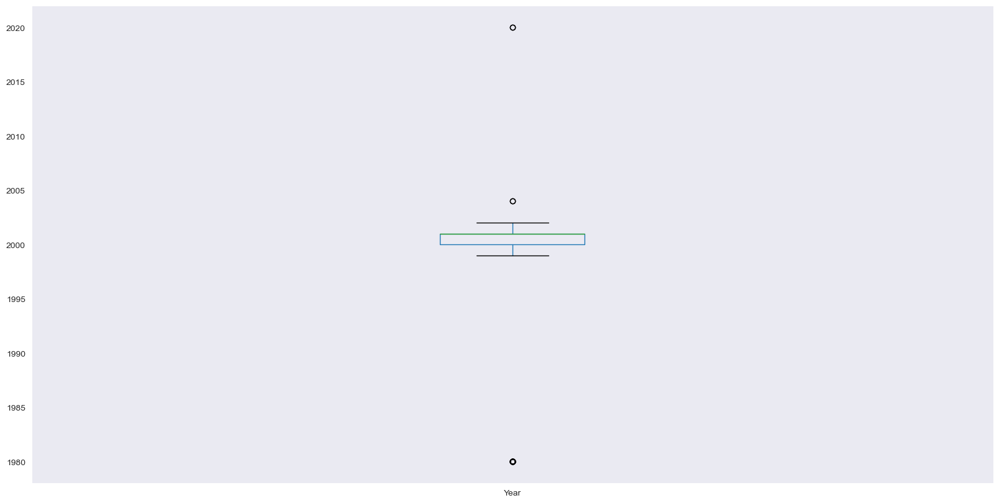

In [22]:
df.boxplot(figsize =(20,10), grid = False) 
plt.show()

In [23]:
df.isnull().sum()

Date          0
From          0
To            0
Subject       0
X-From        0
X-To          0
X-Folder      0
X-Origin      0
X-Filename    0
Body          0
Employee      0
Year          0
dtype: int64

## Exploratory Data Analysis

**Exploratory Data Analysis (EDA) Adımları** 

    Mesaj Sayısının Yıllara Göre Dağılımı
E-posta gönderim trendlerini analiz etmek için yıllara göre gönderilen mesajların sayısını incelemek önemlidir. Bu, zaman içinde e-posta aktivitesindeki artış veya azalışı anlamaya yardımcı olur.

     En Çok E-Posta Gönderenlerin Analizi
Kullanıcıların gönderdiği e-posta sayısına göre sıralama yapılarak, en aktif kullanıcılar belirlenir. Bu analiz, hangi kişilerin daha fazla iletişim kurduğunu ve ağı en çok kimin kullandığını anlamanızı sağlar.

      En Çok E-Posta Alanların Analizi
Alıcıların aldığı e-posta sayısına göre sıralama yapılır. Bu, hangi kullanıcıların daha fazla mesaj aldığını ve iletişimde merkezi bir rol oynayıp oynamadığını tespit etmek için önemlidir.

      Kullanıcı Aktivite Analizi
E-posta kullanıcılarının hangi yıllarda aktif olduklarını analiz ederek, zaman içerisindeki davranış kalıpları tespit edilir. Bu, e-posta aktivitelerindeki sezonluk veya dönemsel değişiklikleri anlamaya olanak sağlar.

     Kullanıcı Bazlı Yıllık Gönderim Analizi
Kullanıcılar arasında yıllık gönderim hacmi analiz edilerek, bireysel aktiviteler görselleştirilir. Bu analiz, kullanıcıların gönderim oranlarındaki değişiklikleri daha iyi anlamaya yardımcı olur.

     E-Posta Ağı Görselleştirmesi
Kullanıcılar arasındaki iletişim ağı bir grafik olarak görselleştirilir. Bu, iletişim akışını ve kullanıcıların birbirleriyle olan bağlantılarını anlamak için faydalıdır.

     Kelime Bulutu Analizleri
E-posta başlıkları ve içerikleri için kelime bulutları oluşturularak, sık kullanılan kelimeler tespit edilir. Bu, e-posta içeriklerinin genel temalarını anlamaya yardımcı olur.

    Metin Temizleme ve Hazırlık
E-posta içerikleri düzenlenerek ve temizlenerek sınıflandırma ve duygu analizi için hazırlanır. Temizleme işlemi, gereksiz karakterlerin kaldırılmasını, metinlerin standartlaştırılmasını ve lemmatizasyonu içerir.

    TF-IDF ile Vektörleştirme
Metin verileri, makine öğrenimi algoritmalarına uygun hale getirilir. TF-IDF vektörleştirme yöntemiyle kelimelerden anlamlı özellikler çıkarılır.

    Veri Normalizasyonu
Veriler normalleştirilerek, farklı ölçekteki özelliklerin analiz sürecini bozmasının önüne geçilir.

    Özellik Sayısını Azaltma
Verilerdeki özellik sayısı azaltılarak analiz ve modelleme süreci hızlandırılır. Bu, özellikle büyük veri setlerinde modelleme performansını artırır.

    Veri Hazırlığı Sonrası Görselleştirme
Son olarak, elde edilen veriler görselleştirilerek analiz sonuçları sunulur. Bu aşama, verilerin daha iyi anlaşılmasını sağlar ve karar alma sürecini kolaylaştırır.


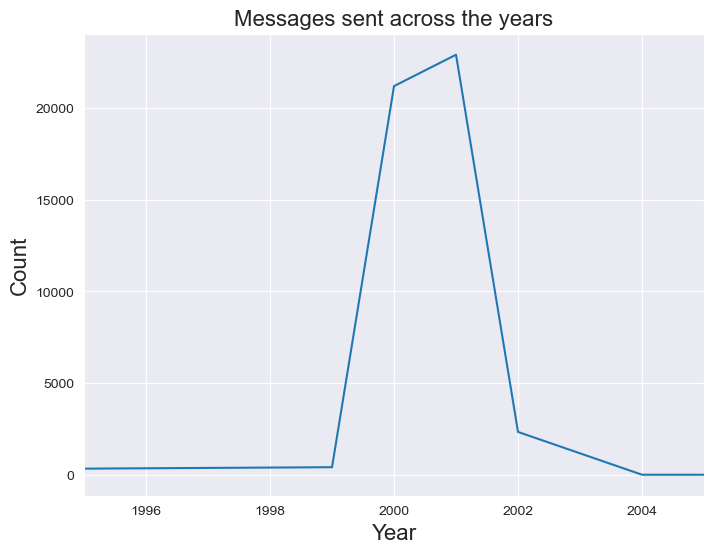

In [24]:
# Bu kod, yıllara göre gönderilen mesaj sayısını gösteren bir çizgi grafiği oluşturur.
# Öncelikle, veri gruplandırılarak yıllık mesaj sayıları sayılır.
# Daha sonra, x-ekseninde yıllar ve y-ekseninde mesaj sayısı ile bir görselleştirme yapılır.

ax = df.groupby(df.Year)['X-Origin'].count().plot(figsize = (8,6))
ax.set_xlim(1995,2005)
ax.set_xlabel('Year', fontsize = 16)
ax.set_ylabel('Count', fontsize = 16)
ax.set_title('Messages sent across the years', fontsize = 16)
plt.show()

**Grafikte, yıllara göre gönderilen mesaj sayısının dağılımını görebiliriz.**

- 1995-1999: Bu dönemde gönderilen mesaj sayısı oldukça düşük. Bu, veri setinin erken yıllarında mesaj gönderim aktivitelerinin sınırlı olduğunu gösterebilir.

- 2000: Mesaj gönderiminde büyük bir artış var ve zirve noktasına ulaşılıyor. Bu artış, Enron şirketinin iletişim aktivitelerinin bu dönemde yoğunlaştığını veya e-posta kullanımının şirket içinde yaygın hale geldiğini gösterebilir.

- 2001: Zirveden sonra hızlı bir düşüş yaşanıyor. Bu düşüş, Enron'un iflas sürecine girdiği yıl olan 2001'deki olaylarla ilişkilendirilebilir.

- 2002 ve sonrası: 2002 ve sonraki yıllarda mesaj sayısı oldukça azalmış ve neredeyse yok denecek seviyeye düşmüştür. Bu, şirketin faaliyetlerinin durması ve dolayısıyla e-posta trafiğinin sona ermesiyle açıklanabilir.

- Grafik, Enron'un organizasyonel faaliyetlerini ve iletişim trendlerini anlamak için kritik bir bakış açısı sunmaktadır.

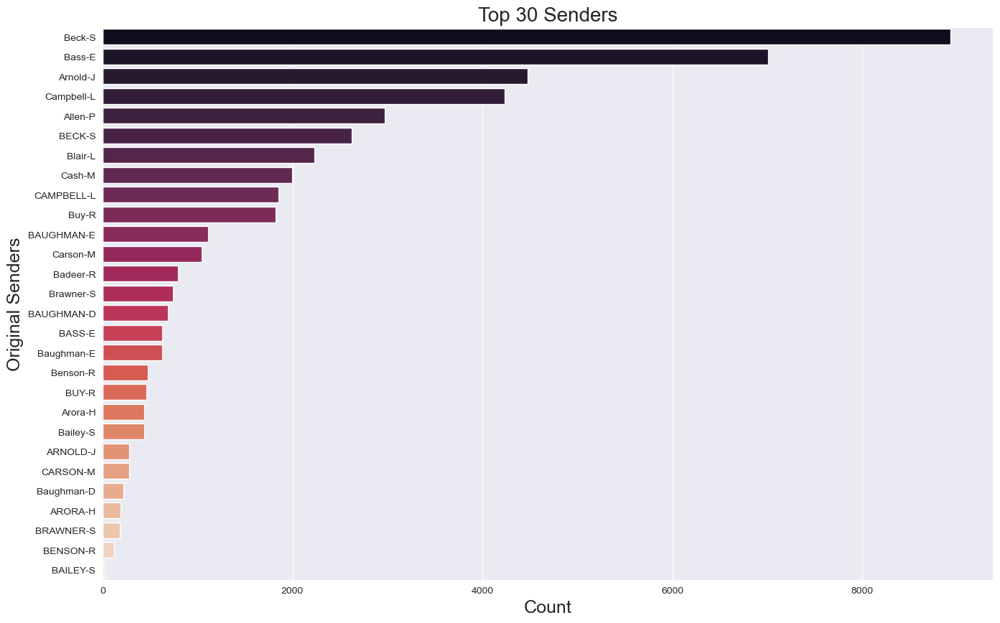

In [25]:
# Bu kod, veri setindeki en aktif 30 e-posta gönderen kişiyi tespit etmek ve görselleştirmek için oluşturulmuştur. 
# X-Origin sütunu, e-postaların kaynak göndericisini temsil eder ve en çok e-posta gönderen göndericiler, 
# sütun değerlerinin sayısına göre sıralanır.
plt.figure(figsize = (16,10))
ax = sns.barplot(x = df['X-Origin'].value_counts().values[:30], y = df['X-Origin'].value_counts().keys()[:30] ,palette = 'rocket', orient = 'h')
ax.set_xlabel('Count', fontsize = 18)
ax.set_ylabel('Original Senders', fontsize = 18)
ax.set_title('Top 30 Senders', fontsize = 20)
plt.show()

**Bu grafik, veri setindeki en aktif 30 e-posta göndericiyi göstermektedir.**

    En Aktif Göndericiler:

- "Beck-S" ve "Bass-E", açık ara farkla en fazla e-posta gönderen kullanıcılar olarak öne çıkmaktadır. Bu durum, bu kişilerin şirket içindeki rolünün iletişim açısından kritik olduğunu gösterebilir.
Daha Düşük Aktivite Seviyeleri:

- "Bailey-S" ve "Arora-H" gibi kullanıcılar, grafiğin alt sıralarında yer alarak diğerlerine göre daha az e-posta göndermiştir.
E-posta Gönderimindeki Çeşitlilik:

- Grafikteki çeşitlilik, belirli bir grup kullanıcının iletişim yükünü taşıdığını ancak aynı zamanda daha az aktif kullanıcıların da bulunduğunu göstermektedir.


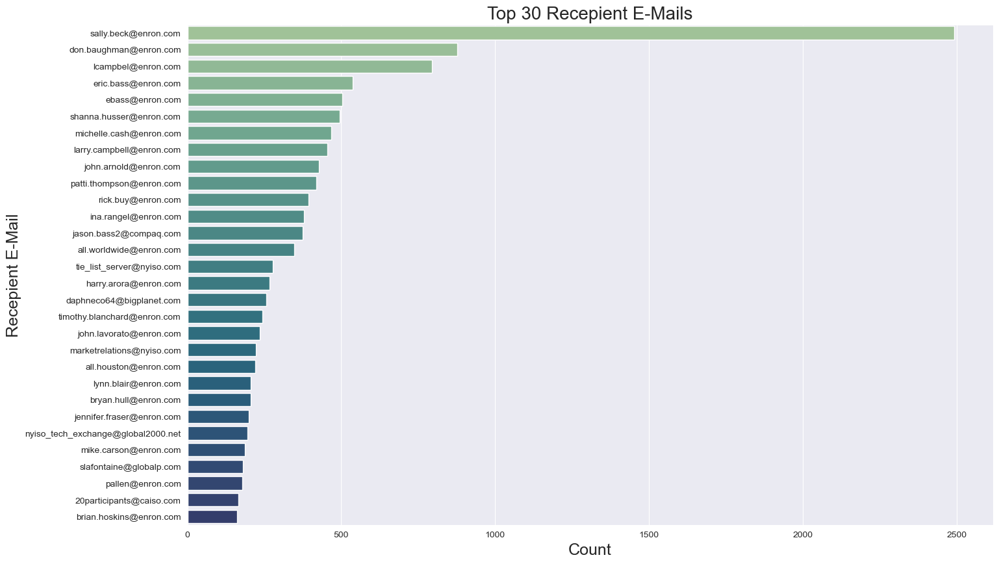

In [26]:
#Bu kod, veri setindeki en çok e-posta alan (alıcısı olan) 30 e-posta adresini görselleştirmek için tasarlanmıştır.
plt.figure(figsize = (16,10))
ax = sns.barplot(x = df['To'].value_counts().values[:30], y = df['To'].value_counts().keys()[:30] ,palette = 'crest', orient = 'h')
ax.set_xlabel('Count', fontsize = 18)
ax.set_ylabel('Recepient E-Mail', fontsize = 18)
ax.set_title('Top 30 Recepient E-Mails', fontsize = 20)
plt.show()

**Bu grafik, veri setindeki en çok e-posta alan ilk 30 e-posta adresini göstermektedir.**

    En Popüler Alıcılar:

- "sally.beck@enron.com", açık ara farkla en fazla e-posta alan kişi olarak öne çıkıyor. Bu, bu kullanıcının şirket içindeki iletişim açısından merkezi bir rol oynadığını gösterebilir.
"don.baughman@enron.com" ve "lcampbel@enron.com" gibi diğer alıcılar da yüksek sayıda e-posta almıştır.
E-posta Trafiği:

- İlk birkaç alıcı, diğerlerine göre çok daha fazla e-posta almıştır. Bu, şirket içindeki iş yükü veya iletişim taleplerinin bu kişilerde yoğunlaştığını gösterebilir.
Çeşitlilik:

- Grafikteki geniş çeşitlilik, şirket içindeki birçok kişinin düzenli olarak e-posta aldığını göstermektedir, ancak belirli kişilerin daha yoğun bir iletişim aldığı açıktır.


In [27]:
# X-Origin sütunundaki benzersiz kullanıcı adlarını bir listeye alıyoruz
userlist = df['X-Origin'].unique()

In [28]:
# Her kullanıcının ilk e-posta gönderdiği yılı bulmak için bir liste oluşturuyoruz
useryears = []
for user in userlist:
     # Kullanıcının gönderim yaptığı ilk yıl bulunuyor
    year = df.loc[df['X-Origin'] == user, 'Year'].iloc[0]
    useryears.append(year)   # Yıl listeye ekleniyor
    useryears

In [29]:
# Her kullanıcının gönderdiği toplam e-posta sayısını hesaplamak için bir liste oluşturuyoruz
usercount = []
counter = 0
for name in userlist:
    # Belirli bir kullanıcının tüm e-posta gönderimlerini sayıyoruz
    for user in df['X-Origin'].values:
        if user == name:
            counter += 1
    usercount.append(counter)  # Toplam gönderim sayısı listeye ekleniyor
    counter = 0                # Sayaç sıfırlanıyor

In [30]:
# Kullanıcı listesi, gönderim sayısı ve yıl bilgilerini birleştiriyoruz ve gönderim sayısına göre sıralıyoruz
dataf = sorted(list(zip(userlist, usercount, useryears)), key= lambda user: user[1], reverse = True)[:30]

In [31]:
# Kullanıcı bilgilerini pandas DataFrame'e dönüştürüyoruz
dataf = pd.DataFrame(dataf)
# Sütunlara anlamlı isimler veriyoruz
dataf.columns = ['User', 'Count', 'Year']
# İlk 5 satırı kontrol ediyoruz
dataf.head()

,User,Count,Year
0,Beck-S,8929,2000
1,Bass-E,7009,2000
2,Arnold-J,4479,2000
3,Campbell-L,4234,2000
4,Allen-P,2971,2001


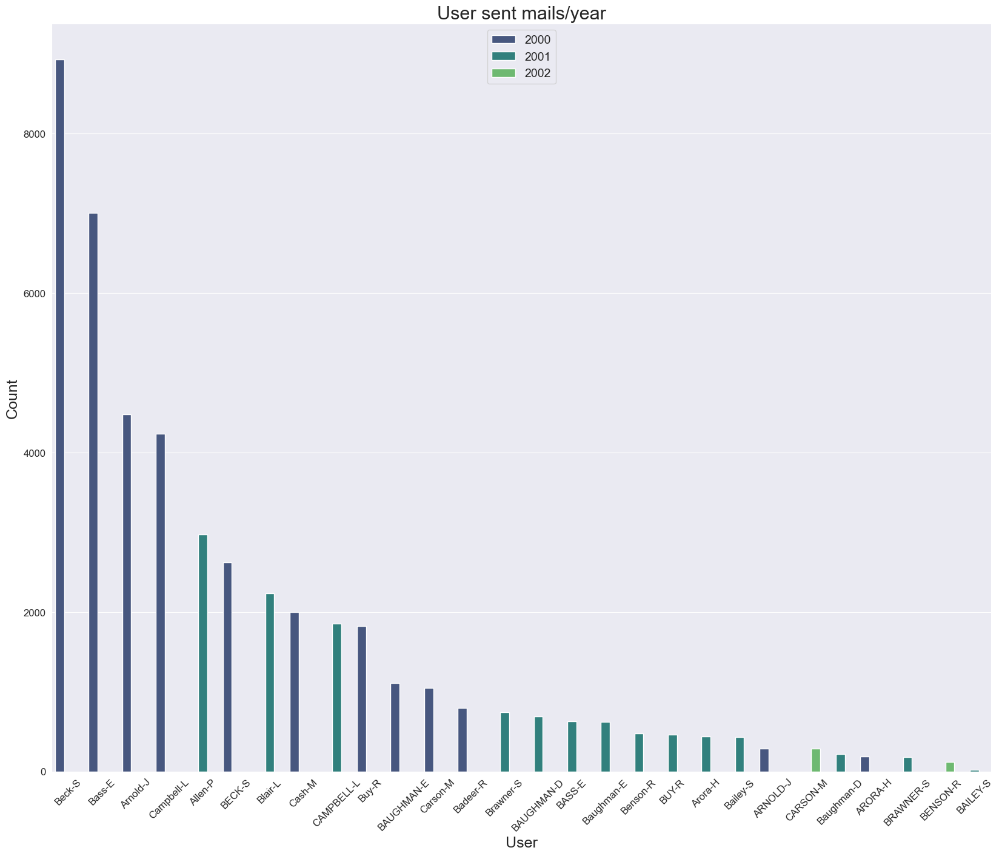

In [32]:
# Grafik boyutunu ayarlıyoruz
plt.figure(figsize=(20, 16))

# Barplot oluşturuyoruz: Kullanıcı başına yıllık e-posta sayısı
# 'User' sütunu x ekseninde, 'Count' sütunu y ekseninde ve yıllar ('Year') renkli olarak gösteriliyor
ax = sns.barplot(data=dataf, x='User', y='Count', hue='Year', palette='viridis', saturation=0.7)


sns.despine()   # Grafik çerçevesini temizliyoruz
plt.xlabel('User', fontsize=18) # X ekseni için etiket ve yazı tipi boyutunu belirliyoruz
plt.ylabel('Count', fontsize=18) # Y ekseni için etiket ve yazı tipi boyutunu belirliyoruz
plt.title('User sent mails/year', fontsize=22) # Başlık ekliyoruz ve yazı tipi boyutunu ayarlıyoruz
plt.xticks(rotation=45, fontsize=12) # X eksenindeki etiketlerin döndürme açısını ve yazı tipi boyutunu ayarlıyoruz
plt.yticks(fontsize=12)# Y eksenindeki etiketlerin yazı tipi boyutunu ayarlıyoruz
plt.legend(fontsize=14) # Grafiğin üst kısmındaki renk efsanesinin yazı tipi boyutunu ayarlıyoruz
plt.show() # Grafiği görüntülüyoruz



**Bu grafik, Enron e-posta veri setindeki kullanıcıların yıllara göre gönderdiği toplam e-posta sayısını göstermektedir.**

- Beck-S ve Bass-E, özellikle 2000 yılında, diğer kullanıcılardan açık ara daha fazla e-posta göndererek en aktif kullanıcılar arasında yer alıyor.
Genel olarak, e-posta gönderme faaliyetlerinin yoğunluğu 2000 ve 2001 yıllarında en yüksek seviyede olduğu görülüyor.

- 2002 yılına ait e-posta gönderim sayısı, önceki yıllara kıyasla oldukça düşüktür, bu da muhtemelen Enron'un 2001 yılındaki iflas sürecine girmesiyle ilişkilendirilebilir.

- Kullanıcıların çoğunun gönderim yaptığı yıllar arasında bir tutarlılık var, ancak 2000 yılı çoğu kullanıcı için zirve yapmış gibi görünüyor.

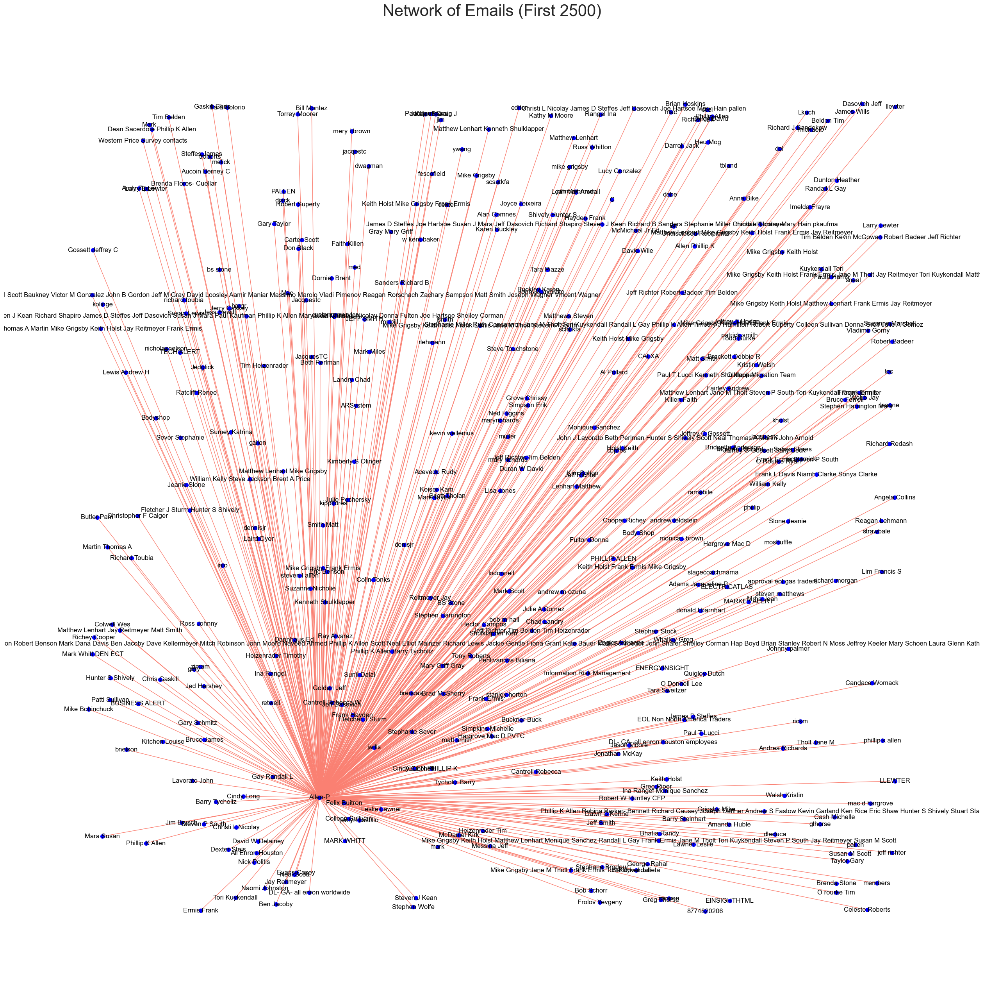

In [33]:
# İlk 2500 satırı kullanarak Allen P'nin e-posta ağını oluşturuyoruz
plt.figure(figsize = (25, 25))
G = nx.from_pandas_edgelist(df[:2500], 'X-Origin', 'X-To')
pos = nx.draw_random(G, node_size = 50, node_color = 'blue', edge_color = 'salmon', with_labels = True)
plt.title('Network of Emails (First 2500)', fontsize = 30)
plt.show()

**Bu grafik, Enron e-posta veri setindeki ilk 2500 satıra dayalı olarak oluşturulmuş bir ağ yapısını göstermektedir. Grafikte düğümler kullanıcıları temsil ederken, düğümler arasındaki çizgiler ("kenarlar") bu kullanıcılar arasında gerçekleşen e-posta alışverişlerini ifade eder.**

    Grafik Yorumu:
 
          Merkezi Düğümler:
- Ağın merkezinde, diğer düğümlere yoğun bir şekilde bağlı olan kullanıcılar yer almakta. Bu kullanıcılar, büyük olasılıkla organizasyon içinde yüksek düzeyde iletişimde bulunan veya e-posta trafiğinin büyük bir kısmını yönlendiren kişilerdir.
- Örneğin, Beck-S ve Bass-E gibi kullanıcılar diğer düğümlere sıkı şekilde bağlı ve bu da onların önemli iletişim noktaları (hub) olduğunu gösterir.

          Bağlantı Yoğunluğu:
- Grafikte yoğun şekilde bağlanmış düğümler, e-posta trafiğinin belli başlı birkaç kişi veya grup etrafında döndüğünü işaret eder.
- Kenarların rengi (somon rengi) ve düğümlerin mavi rengi görseli okunabilir kılmaktadır.

          Dağıtık Düğümler:
- Ağın dış bölgelerinde yer alan ve çok az bağlantısı olan düğümler ise, daha az e-posta alışverişi gerçekleştiren veya belirli bir grup içinde iletişimde olan kullanıcıları temsil eder.

         Organizasyon Yapısı:
- Bu ağ yapısı, Enron şirketi içerisindeki iletişim ağlarının nasıl işlediği ve hangi kullanıcıların daha merkezi bir role sahip olduğunu anlamak için kullanılabilir.
- Özellikle organizasyon içindeki kritik bireylerin belirlenmesi ve hangi kişilerin iletişim merkezleri olduğunun anlaşılması için bu grafik değerlidir.

         İletişim Trendleri:
- Ağdaki bağlantıların yoğunluğu ve dağılımı, belirli dönemlerde artan veya azalan iletişim trendlerini gösterebilir.
- Örneğin, merkezdeki yoğun düğümler, acil veya önemli konuların olduğu dönemlerde iletişimin yoğunluğunu işaret edebilir.


In [34]:
#Bu kod, metin verilerinde sıkça bulunan ve anlam taşımayan kelimeleri ("stopwords") temizlemek için bir hazırlık yapmaktadır.
# Özellikle "Re", "FW" gibi e-posta içeriklerinde yaygın olan kelimeler özel olarak filtrelenmiştir.
# Böylece veri temizleme sürecinde bu kelimeler çıkarılarak analizler daha anlamlı hale getirilir.

import nltk
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')
newstopwords = ['Re', 'FW', 'Fwd', 'EOL', 'E', 'mail', 'PLEASE', 'Ahead']
for i in newstopwords:
    stopwords.append(i)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/oudoum/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


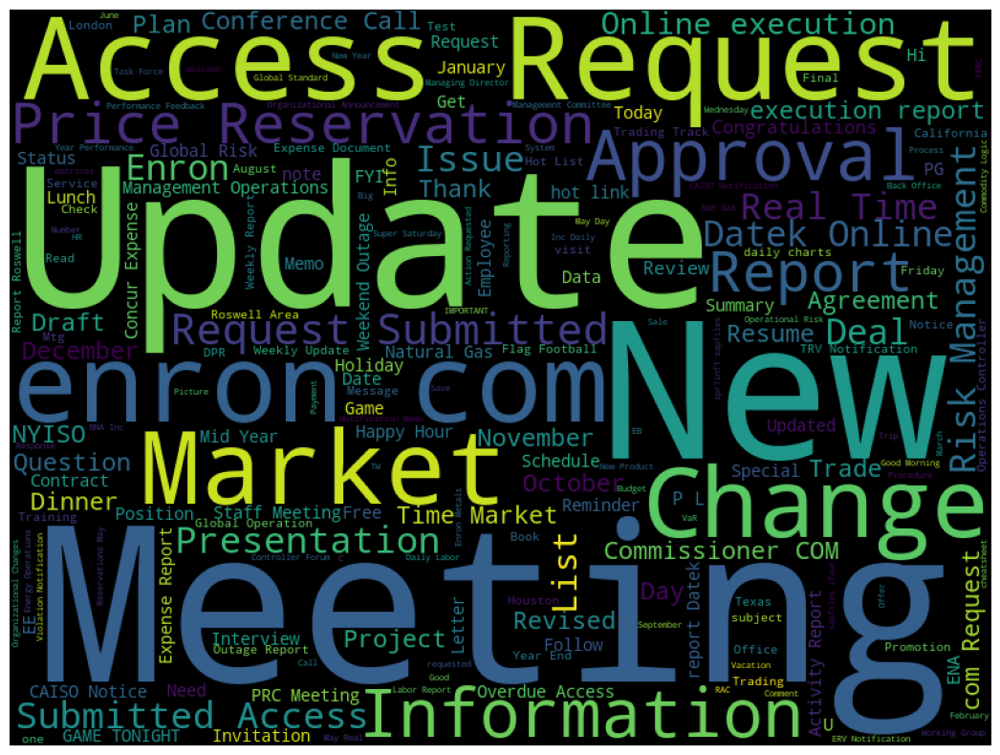

In [35]:
# Bu kod parçası, e-posta başlıklarının içeriğini analiz etmek için bir kelime bulutu oluşturur.
# Kelime bulutu, başlıklarda hangi kelimelerin en sık kullanıldığını görsel olarak sunar.
# Stopwords parametresi, anlamsız kelimelerin görselleştirmeye dahil edilmesini engelleyerek daha anlamlı bir analiz sağlar.

subjects = ' '.join(df['Subject'].values)
fig, ax = plt.subplots(figsize=(14, 10))
wc = wordcloud.WordCloud(width = 800, height = 600, max_words = 200, stopwords = stopwords).generate(subjects)
ax.imshow(wc)
plt.axis('off')
plt.show()

**Bu kelime bulutu grafiği, e-postaların "Konu" (Subject) sütununda yer alan en sık kullanılan kelimeleri görselleştirmektedir. Kelimelerin boyutları, bu kelimelerin ne sıklıkla kullanıldığını ifade eder: daha büyük boyutlu kelimeler, daha sık kullanılan kelimelerdir.**

        Detaylı Yorum:
        
      En Belirgin Kelimeler:
- "Update," "Meeting," "Request," "New," ve "Market" gibi kelimeler en sık kullanılanlar arasında öne çıkmaktadır. Bu kelimeler, Enron çalışanlarının e-posta içeriklerinde düzenli iş güncellemeleri, toplantılar ve talepler gibi operasyonel konulara yoğunlaştığını göstermektedir.

      İş Süreçleri ve Operasyonel İfadeler:
- "Approval," "Information," "Submitted," "Report," ve "Deal" gibi kelimeler, şirket içi iş akışları, onay süreçleri ve raporlama gibi operasyonel faaliyetlerin sıklıkla konu edildiğini işaret eder.

       Tarih ve Planlama:
- "January," "December," "November," gibi ay isimlerinin kullanımı, tarihlerin planlama süreçlerinde önemli bir rol oynadığını gösterir.

      Kişisel ve Sosyal Etkileşimler:
- "Dinner," "Game," "Happy Hour" gibi kelimeler, e-postalarda sosyal etkileşimlere ve etkinliklere de yer verildiğini ortaya koymaktadır.

      Şirket İçi Süreçler:
- "Enron," "Risk Management," ve "Commissioner" gibi terimler, şirketin organizasyonel yapısı ve kurumsal süreçlerini yansıtmaktadır.

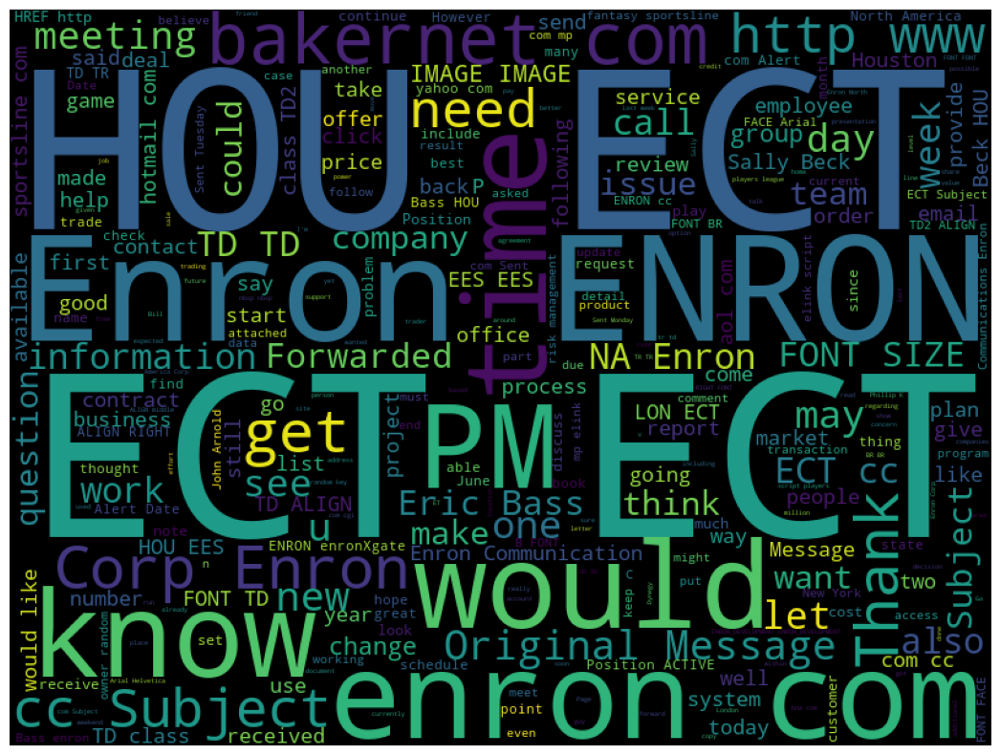

In [36]:
# Bu kod, e-posta gövdelerinde yer alan metinlerin görselleştirilmesi için bir kelime bulutu oluşturur.

content = ' '.join(df['Body'].sample(5000).values)
fig, ax = plt.subplots(figsize=(14, 10))
wc = wordcloud.WordCloud(width = 800, height = 600, max_words = 300, stopwords = stopwords).generate(content)
ax.imshow(wc)
plt.axis('off')
plt.show()

**Bu kelime bulutu, Enron e-posta veri setindeki gövde (body) metinlerinden rastgele seçilen 5000 örneklemle oluşturulmuştur. Görselleştirme, sıkça kullanılan kelimeleri ve terimleri ortaya koyarak e-posta içeriğinin genel temasını anlamayı sağlar.**

       Öne Çıkanlar:
 - 1."Enron" ve "ECT": Bu kelimeler oldukça büyük yazılmış, yani çok sık kullanılmış. Şirketin adını ve birimlerinden birini temsil ediyor olabilir.
 
- 2. İş Süreçleriyle İlgili Kelimeler:
      "Work," "process," "contract," ve "team" gibi terimler, iş faaliyetleri ve iş birliğini temsil ediyor.
         
- 3. İletişim ve Yönlendirme:
     "Forwarded," "group," "call," "send" gibi kelimeler, e-posta iletiminin ve ekip içi iletişimin önemli olduğunu gösteriyor.
      
- 4. Soru ve Talep:
      "Need," "question," "ask," "know," "would," "let," gibi kelimeler, e-posta içeriğinde sıkça bilgi talebi ve soruların yer aldığını gösteriyor.
      
- 5. Ticari ve Finansal Temalar:
     "Price," "market," "offer," "transaction" gibi kelimeler, finansal ve ticari süreçlerin odakta olduğunu ima ediyor.


In [37]:
# NLTK'nin WordNet veri kümesini indiriyor
# WordNet, doğal dil işleme için kelime anlamlarını ve ilişkilerini içeren bir leksik veritabanıdır.
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /Users/oudoum/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [38]:
# NLTK'nin punkt modülünü indiriyor
# Punkt, metinlerin cümlelere ve kelimelere ayrıştırılması için kullanılan bir tokenize aracıdır.
nltk.download('punkt')

[nltk_data] Downloading package punkt to /Users/oudoum/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [39]:
# Gövde metinlerini temizlemek için bir fonksiyon tanımlıyoruz
def cleaningbody(col):
    msgcol = []
    for msg in col.values:
        msg = re.sub(r'[<>\n+\t+\s+\*]', ' ', msg)
        msg = re.sub(r'[0-9]+[a-zA-Z]+\d+[?!].DOC', ' ', msg)
        msg = re.sub(r'[?\s+\-+\s+?_=~]', ' ', msg)
        msg = re.sub(r' +', ' ', msg)
        msg = msg.lower().strip(' ')
        msgcol.append(msg)
    return msgcol
df['Body'] = cleaningbody(df['Body'])

In [40]:
# Lemmatization (kelime kökünü bulma) işlemi için bir lemmatizer nesnesi oluşturuyoruz
# WordNetLemmatizer, kelimeleri anlamlarına göre köklerine indirger.
lemmatizer = WordNetLemmatizer()

In [41]:
# NLTK'nin punkt_tab modülünü indiriyor
# Bu modül, cümle ve kelime tokenize işlemleri için gerekli bir veri kümesidir.
import nltk
nltk.download('punkt_tab')

# Metinleri tokenlere ve lemmatized (kök) kelimelere ayırma işlemi
# Bu işlem, metinleri sınıflandırma ve duygu analizi için hazırlar
text = []
for msg in df['Body'].values:
    msg_tokens = word_tokenize(msg)
    msg_tokens = [token.lower() for token in msg_tokens if token.isalpha()]
    msg_tokens = [word for word in msg_tokens if not word in stopwords]
    msg_tokens = [lemmatizer.lemmatize(word) for word in msg_tokens]
    
    text.append(msg_tokens)

[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/oudoum/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [42]:
# Tokenlerin birleştirilerek string haline getirilmesi
# Text'in her bir elemanı bir cümle olarak yeniden birleştiriliyor
text = [' '.join(message) for message in text]

In [43]:
# TF-IDF (Term Frequency-Inverse Document Frequency) kullanarak metin verilerini vektörleştirme
# Bu işlem, metin verilerini sayısal özelliklere dönüştürerek modellemeye uygun hale getirir
vectorizer = TfidfVectorizer(min_df = 5, max_features = 5000, stop_words = stopwords, norm = 'l1')
data = vectorizer.fit_transform(text)

/Users/oudoum/opt/anaconda3/lib/python3.9/site-packages/sklearn/feature_extraction/text.py:404: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ahead', 'eol', 'fw', 'fwd', 'please'] not in stop_words.
  warnings.warn(


In [44]:
# Veriyi normalize etme işlemi
# Verilerin ölçeklerini eşitlemek için normalize edilir
data_norm = normalize(data)

In [45]:
# Normalize edilmiş verinin boyutlarını yazdırır
# Satır sayısı örnek sayısını, sütun sayısı ise özellik sayısını belirtir
print(data_norm.shape)

(46884, 5000)


In [46]:
# Veriyi boyut azaltma işlemi
# Özellik sayısını düşürmek için Truncated SVD (Singular Value Decomposition) uygulanır
# Bu, verinin daha kompakt bir temsilini sağlar ve hesaplama maliyetini azaltır
svd = TruncatedSVD(n_components = 2, n_iter = 10, random_state = 42)
datasvd = svd.fit_transform(data_norm)

In [47]:
# Yeni boyutların (bileşenlerin) sayısını yazdırır
datasvd.shape

(46884, 2)

# Sentiment Analysis

In [49]:
!pip install vadersentiment

In [50]:
!pip install NRCLex

In [51]:
# Sentiment Analysis için gerekli kütüphaneler import ediliyor
# - vaderSentiment: Duygu analizi için önceden eğitilmiş bir model içerir.
# - SentimentIntensityAnalyzer: Cümlelerin pozitif, negatif ve nötr duygusal tonlarını belirlemek için kullanılır.
# - NRCLex: Daha detaylı duygu analizi yapmayı sağlayan bir araçtır.
import vaderSentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from nrclex import NRCLex

In [52]:
# Sentiment analyzer için bir örnek oluşturuluyor
# Bu, metinlerin duygusal tonlarını analiz etmeye hazır bir analizör sağlar.
analyzer = SentimentIntensityAnalyzer()

In [53]:
# Metinlerin sentiment skorlarını hesaplayarak yeni bir sütun ekleniyor
# analyzer.polarity_scores: Her bir metin için pozitif, negatif, nötr skorlar ve genel duygu skoru döner.
# Bu sonuçlar 'sentiment scores' adında bir sütun olarak DataFrame'e ekleniyor.
df['sentiment scores'] = [analyzer.polarity_scores(message) for message in text]
df.sample(5)

,Date,From,To,Subject,X-From,X-To,X-Folder,X-Origin,X-Filename,Body,Employee,Year,sentiment scores
43616,2001-11-18 05:54:45+00:00,whatsnew@launch-media.net,lcampbel@enron.com,Big news for LAUNCH members only,Launch,lcampbel,"\Larry_Campbell_Jan2002_1\Campbell, Larry F.\I...",Campbell-L,lcampbel (Non-Privileged).pst,[image] launch news alert! [image] [image] hey...,campbell-l,2001,"{'neg': 0.039, 'neu': 0.788, 'pos': 0.173, 'co..."
19604,2001-12-12 22:24:35+00:00,brandon.wax@enron.com,"don.baughman@enron.com, brad.richter@enron.com",West Power,Wax Brandon,Baughman Jr Don,"\Edward_Baughman_Jan2002\Baughman Jr., Don\Inbox",Baughman-E,dbaughm (Non-Privileged).pst,i have spoken with calger about us going throu...,baughman-d,2001,"{'neg': 0.0, 'neu': 0.842, 'pos': 0.158, 'comp..."
29997,2000-12-11 08:58:00+00:00,michelle.vitrella@enron.com,"chris.foster@enron.com, kevin.presto@enron.com...",EnTouch Deadline,Michelle Vitrella,Chris H Foster Kevin M Presto John Arnold Scot...,\Sally_Beck_Dec2000\Notes Folders\Notes inbox,Beck-S,sbeck.nsf,if your team would like to contribute to this ...,beck-s,2000,"{'neg': 0.0, 'neu': 0.573, 'pos': 0.427, 'comp..."
29874,2000-12-01 11:44:00+00:00,shona.wilson@enron.com,"bob.hall@enron.com, leslie.reeves@enron.com, j...",help requested for doorstep to NY,Shona Wilson,Bob M Hall Leslie Reeves Jeffrey C Gossett Peg...,\Sally_Beck_Dec2000\Notes Folders\Notes inbox,Beck-S,sbeck.nsf,i haven't heard from any of you as to whether ...,beck-s,2000,"{'neg': 0.0, 'neu': 0.813, 'pos': 0.187, 'comp..."
6727,2001-10-01 13:32:38+00:00,john.arnold@enron.com,jennifer.fraser@enron.com,,Arnold John,Fraser Jennifer,"\JARNOLD (Non-Privileged)\Arnold, John\Sent Items",Arnold-J,JARNOLD (Non-Privileged).pst,why is george down,arnold-j,2001,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."


In [54]:
# Duygusal tonları belirlemek için sentiment skorlarına dayalı sınıflandırma yapılıyor
# Compound skoru kullanılarak mesajların pozitif, negatif veya nötr olduğu belirleniyor
sentiment = []
for i in df['sentiment scores'].values:
    if i['compound'] > 0.05:
        sentiment.append('Positive')
    elif i['compound'] < 0.05:
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
df['Sentiment'] = sentiment

In [55]:
# Veri kümesindeki sentiment sütunundaki pozitif, negatif ve nötr mesaj sayıları hesaplanıyor
# Bu sonuçlar genel mesaj dağılımını anlamak için bir özet sağlıyor
sentiment_values = df['Sentiment'].value_counts()
sentiment_values

Positive    39325
Negative     7558
Neutral         1
Name: Sentiment, dtype: int64

In [56]:
#  Duygusal tonların bir huni grafik olarak görselleştirilmesi
fig = px.funnel(sentiment_values)
fig.show()

**Bu görsel, metinler üzerinde yapılan duygu analizinin sonuçlarını bir huni grafiği ile özetlemektedir. Grafikte, pozitif, negatif ve nötr duygu durumlarının dağılımı aşağıdaki şekilde gösterilmiştir:*

        Pozitif Duygular (Positive):
- Grafiğin en üst katmanında pozitif duyguya sahip metinlerin sayısı gösterilmiştir.
- Verilere göre, pozitif duyguya sahip metinler 39.325 gibi yüksek bir sayıya ulaşmıştır. Bu, analiz edilen metinlerin büyük çoğunluğunun olumlu bir tona sahip olduğunu gösterir.

      Negatif Duygular (Negative):
- İkinci katman, negatif duyguları temsil eder.
- Negatif duyguya sahip metinlerin sayısı 7.558 olarak gözlemlenmiştir. Bu, pozitif metinlere göre oldukça düşük bir oranı temsil eder ve genel olarak iletişimlerin olumlu bir çerçevede gerçekleştiğini ifade eder.

      Nötr Duygular (Neutral):
- En alt katmanda nötr duygular yer alır.
- Sadece 1 metin nötr duyguya sahip olarak belirlenmiştir. Bu, analiz edilen veri setinde nötr tonların nadiren bulunduğunu ifade eder.


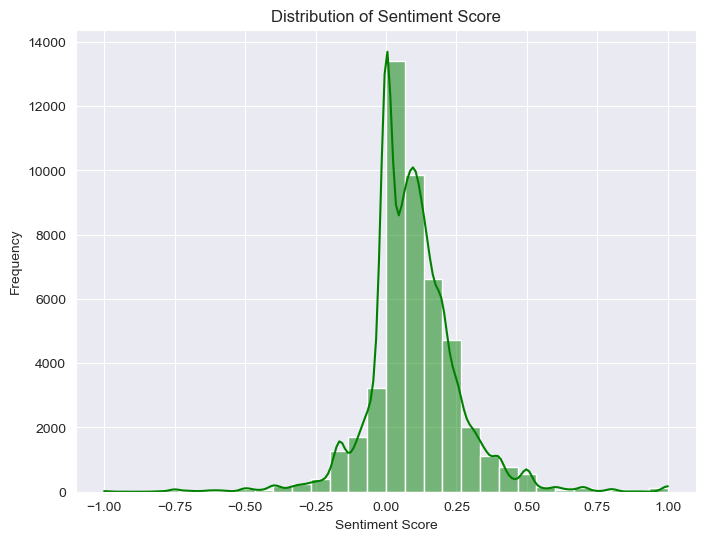

In [57]:
# TextBlob kütüphanesini import ediyoruz, bu kütüphane metinlerde duygu analizi yapmak için kullanılıyor.
from textblob import TextBlob

df['Body'] = df['Body'].fillna('')  # Boş değerleri doldur
df['Sentiment'] = df['Body'].apply(lambda x: TextBlob(str(x)).sentiment.polarity)

# distribution of Sentiment Scores
plt.figure(figsize=(8, 6))
sns.histplot(df['Sentiment'], bins=30, kde=True, color='green')
plt.title('Distribution of Sentiment Score')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

**Bu grafik, metinlerin duygu polarite skorlarının dağılımını göstermektedir.**


- Yoğunluk Merkezi: Çoğu polarite skoru 0 civarında yoğunlaşmış, bu da mesajların büyük bir kısmının nötr veya hafif olumlu bir ton içerdiğini göstermektedir.
- Negatif ve Pozitif Dağılım: Sol tarafta (-0.75 ile -1 arasında) çok az negatif mesaj bulunurken, sağ tarafta (+0.5 ile +1 arasında) pozitif mesajlar daha az sayıda ama varlık göstermektedir.
- Eğri: KDE eğrisi, dağılımın şekli ve eğilimi hakkında fikir verir. Nötr mesajlar açık ara en yoğun grubu oluşturuyor.

In [58]:
# NRCLex kullanarak metinlerde farklı duyguların analizi için bir fonksiyon tanımlanıyor.
def sentiment(message):
    text = NRCLex(message)
    if text.top_emotions[0][1] == 0.0:
        return 'No Emotion'
    else:
        return text.top_emotions[0][0]
df['Emotions'] =  df['Body'].apply(sentiment)
df.sample(5)

,Date,From,To,Subject,X-From,X-To,X-Folder,X-Origin,X-Filename,Body,Employee,Year,sentiment scores,Sentiment,Emotions
17203,2000-08-21 09:09:00+00:00,eric.bass@enron.com,o'neal.winfree@enron.com,Re: Gonzalez,Eric Bass,O Neal D Winfree,\Eric_Bass_Dec2000\Notes Folders\Sent,Bass-E,ebass.nsf,i will give you walls and terrence wilkins to:...,bass-e,2000,"{'neg': 0.0, 'neu': 0.9, 'pos': 0.1, 'compound...",-0.026488,negative
6673,2001-09-17 18:56:55+00:00,john.arnold@enron.com,john.lavorato@enron.com,,Arnold John,Lavorato John,"\JARNOLD (Non-Privileged)\Arnold, John\Sent Items",Arnold-J,JARNOLD (Non-Privileged).pst,p&l / 48,arnold-j,2001,"{'neg': 0.0, 'neu': 0.25, 'pos': 0.75, 'compou...",0.000000,No Emotion
30157,2001-01-30 10:46:00+00:00,cwhite@viviance.com,cwhite@texas.usta.com,RE: the latest . . .,Cindy White,White Cara,\Sally_Beck_Nov2001\Notes Folders\Personal,BECK-S,sbeck.nsf,jeffrey's/josephine sounds excellent. i could ...,beck-s,2001,"{'neg': 0.018, 'neu': 0.762, 'pos': 0.22, 'com...",0.259693,positive
13224,2000-10-16 08:06:00+00:00,eric.bass@enron.com,bryan.hull@enron.com,Re: Fantasy Basketball,Eric Bass,Bryan Hull,\Eric_Bass_Dec2000\Notes Folders\All documents,Bass-E,ebass.nsf,in they were all fair trades from: bryan hull ...,bass-e,2000,"{'neg': 0.0, 'neu': 0.748, 'pos': 0.252, 'comp...",0.345833,positive
49866,2001-09-21 20:53:02+00:00,michelle.cash@enron.com,rick.johnson@enron.com,FW: Military leave issues - Policy Primer,Cash Michelle,Johnson Rick,"\MCASH (Non-Privileged)\Cash, Michelle\Sent Items",Cash-M,MCASH (Non-Privileged).pst,"rick, nice kudos from robert. would you mind k...",cash-m,2001,"{'neg': 0.045, 'neu': 0.724, 'pos': 0.231, 'co...",0.150787,trust


In [59]:
# 'Emotions' sütunundaki duygu verilerinin frekansını hesaplıyoruz.
emotions = df['Emotions'].value_counts()
emotion_chart = pd.DataFrame(emotions)
emotion_chart = emotion_chart.drop('No Emotion', axis = 0)
emotion_chart

,Emotions
positive,26625
trust,5958
negative,5502
anticipation,2616
surprise,1167
fear,1032
anger,371
sadness,43
disgust,17
joy,2


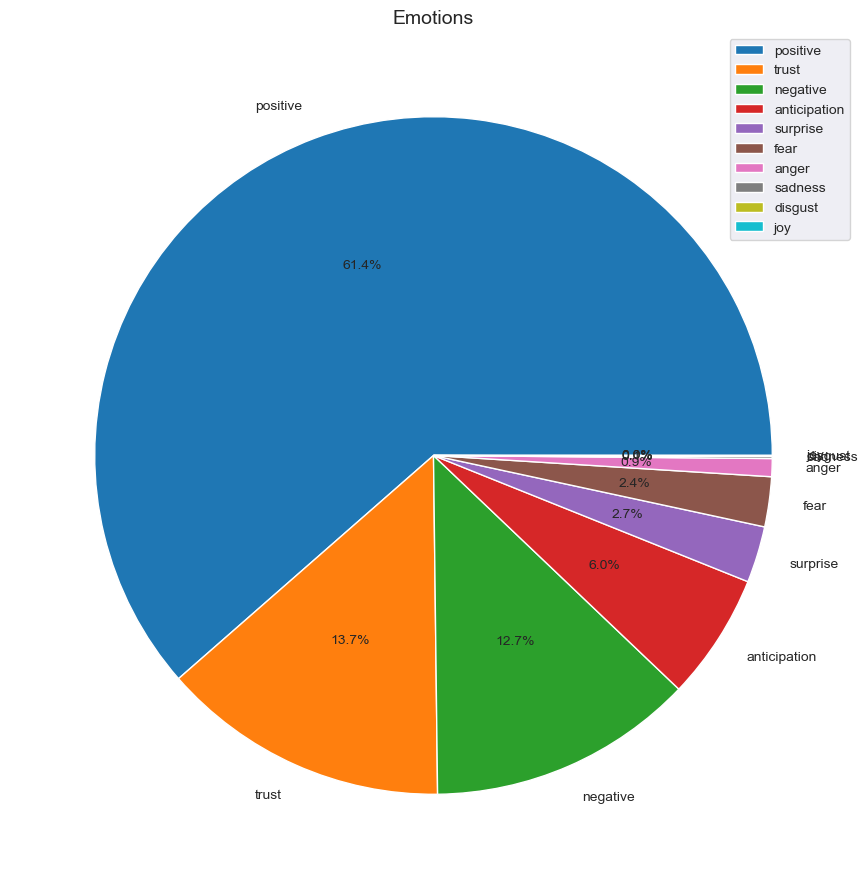

In [60]:
# Metindeki her bir duygunun yüzdesini göstermek için bir pasta grafiği
labels = emotion_chart.index.tolist()
plt.figure(figsize = (11,11))
plt.pie(emotion_chart['Emotions'].values, labels = labels , autopct = '%1.1f%%', labeldistance= 1.1)
plt.title('Emotions', fontsize = 14)
plt.legend(loc = 'upper right')
plt.show()


### 4.2.1 label encoding¶

In [61]:
from sklearn.preprocessing import LabelEncoder

In [62]:
# Sentiment sütununu kodlamak için label encoder kullanımı
le = LabelEncoder()
df['Sentiment'] = le.fit_transform(df['Sentiment'])
# Sayısal etiketlerin orijinal duygu sınıflarına eşlenmesi
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Label mapping:")
print(label_mapping)

Label mapping:
{-1.0: 0, -0.9375: 1, -0.8: 2, -0.7999999999999999: 3, -0.75: 4, -0.7380952380952381: 5, -0.7142857142857143: 6, -0.7: 7, -0.6999999999999998: 8, -0.6666666666666666: 9, -0.6518518518518519: 10, -0.6499999999999999: 11, -0.631076388888889: 12, -0.625: 13, -0.607204861111111: 14, -0.6: 15, -0.5833333333333334: 16, -0.5666666666666667: 17, -0.5625: 18, -0.5599999999999999: 19, -0.5555555555555555: 20, -0.5364583333333333: 21, -0.5: 22, -0.49999999999999994: 23, -0.48333333333333334: 24, -0.4833333333333333: 25, -0.4777777777777778: 26, -0.4768518518518518: 27, -0.475: 28, -0.47222222222222227: 29, -0.4720238095238095: 30, -0.4717592592592592: 31, -0.46666666666666673: 32, -0.4583333333333333: 33, -0.45416666666666666: 34, -0.45: 35, -0.43333333333333335: 36, -0.43333333333333324: 37, -0.4202380952380952: 38, -0.4166666666666667: 39, -0.4125: 40, -0.40625: 41, -0.4: 42, -0.3979166666666667: 43, -0.39444444444444443: 44, -0.3888888888888889: 45, -0.38333333333333336: 46, -0.

In [63]:
# Her bir sınıf için veri sayısı
class_counts = df['Sentiment'].value_counts()
print("Number of data points for each class:")
print(class_counts)

Number of data points for each class:
1689     6139
9839      946
227       661
5874      570
10859     382
         ... 
9371        1
7654        1
1250        1
7692        1
2841        1
Name: Sentiment, Length: 12357, dtype: int64


In [65]:
# Sınıf dağılımını kontrol et
print(df['Sentiment'].value_counts())

# Az sayıda örneğe sahip sınıfları çıkar
df = df[df['Sentiment'].map(df['Sentiment'].value_counts()) > 1]

# Train-test split
xtrain, xtest, ytrain, ytest = train_test_split(
    df['Body'], df['Sentiment'], stratify=df['Sentiment'], random_state=42, test_size=0.2
)

print(ytrain.value_counts())

1689     6139
9839      946
227       661
5874      570
10859     382
         ... 
9371        1
7654        1
1250        1
7692        1
2841        1
Name: Sentiment, Length: 12357, dtype: int64
1689     4911
9839      757
227       529
5874      456
10859     306
         ... 
2417        2
2576        2
9918        2
7620        2
7344        2
Name: Sentiment, Length: 6084, dtype: int64


In [66]:
# TfidfVectorizer'ı başlat
tfv = TfidfVectorizer(min_df=3,  max_features=None, decode_error = "replace", 
            strip_accents='unicode', analyzer='word',token_pattern=r'\w{1,}',
            ngram_range=(1, 3), use_idf=1,smooth_idf=1,sublinear_tf=1,
            stop_words = 'english')

# Tfidf vectorizer'ı eğitim veri setine fit etme
tfv.fit(list(xtrain))

# Dönüştürme işlemi
xtest_tfv = tfv.transform(xtest)
xtrain_tfv = tfv.transform(xtrain)


# Modellerin Eğitimi ve Değerlendirilmesi

**Modellerin eğitimi ve değerlendirilmesi için, öncelikle K-Means kümeleme ile veriyi gruplara ayırarak küme merkezlerini ve önemli özelliklerini belirledik. Dirsek yöntemiyle optimal küme sayısı belirlendi ve görselleştirildi. Ardından, MLP sınıflandırıcı kullanılarak model eğitildi, test setinde doğruluğu ölçüldü ve sınıflandırma raporu oluşturuldu. Bu adımlar, veri gruplarını anlamak ve duygu analizi için etkili modeller geliştirmek amacıyla gerçekleştirildi.**

### K-Means

- K-Means, verileri belirli sayıda küme veya gruba ayırmak için kullanılan popüler ve basit bir kümeleme (clustering) algoritmasıdır. Gözetimsiz öğrenme yöntemlerinden biridir ve genellikle veri noktalarını benzer özelliklere göre gruplamak amacıyla kullanılır.

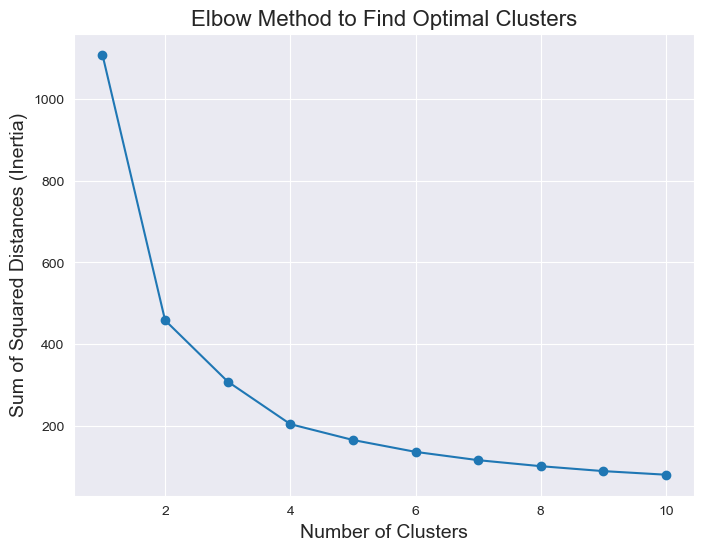

In [67]:

## Elbow yöntemi kullanılarak K-Means kümeleme için optimum küme sayısını belirliyoruz.
max_iter = 1000
sumsquares = []
number_clusters = range(1, 11)

for i in number_clusters:
    kmeans = KMeans(n_clusters=i, max_iter=max_iter, n_init=10)  # 'auto' yerine 10 kullanıldı
    kmeans.fit(datasvd)  # datavsd veri çerçeveniz veya numpy array'ınız olmalı
    sumsquares.append(kmeans.inertia_)

# Plotting the Elbow method
plt.figure(figsize=(8, 6))
plt.plot(number_clusters, sumsquares, marker='o')
plt.xlabel('Number of Clusters', fontsize=14)
plt.ylabel('Sum of Squared Distances (Inertia)', fontsize=14)
plt.title('Elbow Method to Find Optimal Clusters', fontsize=16)
plt.grid(True)
plt.show()

# Bu kod, Elbow yöntemini kullanarak farklı küme sayıları için toplam kareler uzaklığını hesaplar
# ve optimum küme sayısını görsel olarak belirlememize olanak tanır.

**Grafiğin Yorumlanması:**

- **X Ekseni (Number of Clusters):** Kümeleme işlemi için denenen küme sayıları (1'den 10'a kadar).

- **Y Ekseni (Sum of Squared Distances - Inertia):** Kümeleme sırasında her bir verinin kendi kümesine olan                                                             mesafelerinin karelerinin toplamı. Bu değer, kümelerin içindeki                                                     tutarlılığı ifade eder; yani, değer ne kadar küçükse kümeler o                                                     kadar sıkıdır.

- **Düşüş Eğrisi:** Grafikte, başlangıçta (küme sayısı düşükken) kareler toplamı (inertia) hızla düşüyor. 
   Bu, eklenen kümenin her seferinde veri içindeki çeşitliliği daha iyi temsil ettiğini gösterir. Ancak, küme          sayısı arttıkça bu düşüş yavaşlar ve grafikte bir "dirsek" noktası oluşur.
                
- **Dirsek Noktası:** Grafikteki "dirsek" noktası, kümeler arası mesafelerin anlamlı şekilde azalmayı bıraktığı                           noktadır. Bu noktadan sonra daha fazla küme eklemek modelin performansına anlamlı bir katkı                         sağlamaz. Bu grafikte, dirsek noktası 3 veya 4 küme civarında gözlemlenebilir.


In [68]:
# Bu kod, K-Means algoritmasının uygulamasını ve model parametrelerini içerir.
# Kullanılan parametreler, modelin hem doğru hem de optimize edilmiş bir kümeleme işlemi gerçekleştirmesini sağlar.
# Özellikle random_state, yeniden üretilebilirlik açısından önemlidir ve modelin tutarlılığını artırır.
# Sonuç olarak, her bir veri noktası belirlenen kümelerden birine atanmış ve her kümenin merkezi belirlenmiştir.

# Parametreler
n_clusters = 6
max_iter = 1000
tol = 0.0001
algorithm = 'lloyd'

# KMeans model
clf = KMeans(
    n_clusters=n_clusters, 
    init='random', 
    max_iter=max_iter, 
    tol=tol, 
    algorithm=algorithm, 
    n_init=10,  # 'auto' yerine 10 kullanıldı
    random_state=42
)

# Modeli eğit ve tahmin yap
fittedkmeans = clf.fit_predict(datasvd)
centroids = clf.cluster_centers_


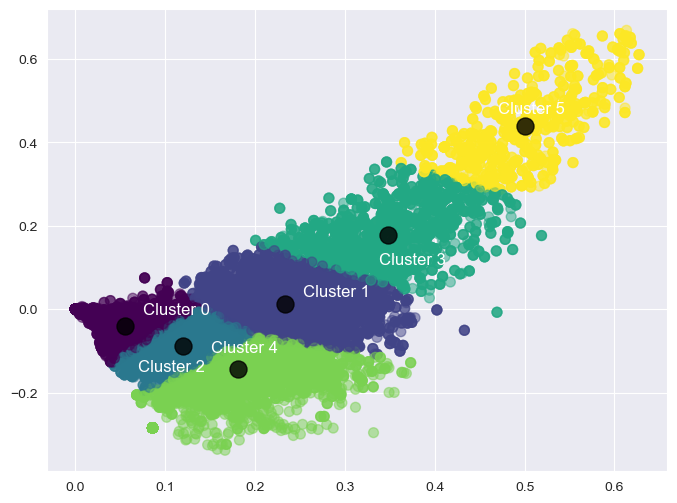

In [69]:
# Bu grafik, K-Means algoritmasının çıktısını görselleştirir. Veriler 6 kümeye bölünmüş ve her bir küme farklı renklerle temsil edilmiştir.
# Kümelerin merkezleri siyah noktalar olarak belirtilmiş ve üzerlerine küme numaraları eklenmiştir.
# Etiketlemeler, kümeler hakkında daha iyi bir fikir edinmemizi sağlar. Grafik, verilerin dağılımı ve kümelenme yapısını açıkça göstermektedir.

# Kümelemeyi gösteren bir grafik
plt.figure(figsize = (8,6))
plt.scatter(datasvd[:,0], datasvd[:,1], c = fittedkmeans, s = 50, cmap = 'viridis', alpha = 0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], s = 150, c = 'black', alpha = 0.8)
plt.annotate('Cluster 0', xy = (centroids[0][0], centroids[0][1]), xytext = (centroids[0][0] + 0.02, centroids[0][1] + 0.03), color = 'white', fontsize = 12)
plt.annotate('Cluster 1', xy = (centroids[1][0], centroids[1][1]), xytext = (centroids[1][0] + 0.02, centroids[1][1] + 0.02), color = 'white', fontsize = 12)
plt.annotate('Cluster 2', xy = (centroids[2][0], centroids[2][1]), xytext = (centroids[2][0] - 0.05, centroids[2][1] - 0.06), color = 'white', fontsize = 12)
plt.annotate('Cluster 3', xy = (centroids[3][0], centroids[3][1]), xytext = (centroids[3][0] - 0.01, centroids[3][1] - 0.07), color = 'white', fontsize = 12)
plt.annotate('Cluster 4', xy = (centroids[4][0], centroids[4][1]), xytext = (centroids[4][0] - 0.03, centroids[4][1] + 0.04), color = 'white', fontsize = 12)
plt.annotate('Cluster 5', xy = (centroids[5][0], centroids[5][1]), xytext = (centroids[5][0] - 0.03, centroids[5][1] + 0.03), color = 'white', fontsize = 12)

plt.show()

**Bu grafik, K-Means algoritmasıyla yapılan kümeleme sonucunda elde edilen 6 farklı kümeyi göstermektedir.**

- Renkler: Her renk farklı bir kümeyi temsil eder ve verilerin hangi gruba ait olduğunu görselleştirir.
- Siyah Noktalar: Her bir kümenin merkezini temsil eder ve kümelerin ortalama konumunu gösterir.
- Küme Etiketleri: "Cluster 0", "Cluster 1" gibi etiketler, kümelerin hangi bölgede olduğunu anlamayı kolaylaştırır.
- Bu grafik, verilerin açıkça ayrıldığını ve kümelerin net bir şekilde tanımlandığını göstermektedir. Verilerin yoğunlaştığı ve kümelerin ayrıştığı noktalar, K-Means algoritmasının etkili çalıştığını doğrulamaktadır.

In [70]:
# Her kümedeki en önemli kelimeleri inverse_transform yöntemi ile çıkarıyoruz.
# original_space_centroids: Küme merkezlerinin orijinal özellik uzayındaki temsilini sağlar.
# order_centroids: Küme merkezlerini önem sırasına göre sıralar.
# terms: TF-IDF vektörizeri tarafından oluşturulan kelime özelliklerini temsil eder.

original_space_centroids = svd.inverse_transform(kmeans.cluster_centers_)
order_centroids = original_space_centroids.argsort()[:, ::-1] #(10,5000)
terms = vectorizer.get_feature_names_out()

for i in range(n_clusters):
    print(f"Cluster {i}: ", end="")
    for ind in order_centroids[i, :20]:
        print(f"{terms[ind]} ", end="")
        
    print()

Cluster 0: http please enron message subject would thanks know pm sent time meeting original get week let sally need new day 
Cluster 1: ect enron cc eric subject pm forwarded communication ee development sally john david enronxgate brian bryan phillip america north matthew 
Cluster 2: ect enron cc subject pm eric sally forwarded john communication ee development please thanks meeting know david would phillip let 
Cluster 3: http enron please subject pm would message thanks know meeting sent time sally cc get original let week need john 
Cluster 4: http enron please subject message would thanks pm know sent meeting time get original sally week let need cc new 
Cluster 5: ect enron subject pm cc please sally eric john thanks meeting forwarded know would let communication message ee time sent 


Küme 0: http lütfen enron mesaj konu olur teşekkürler bil pm gönderildi zaman toplantı orijinal al haftası sally ihtiyaç yeni gün  
Küme 1: ect enron cc eric konu pm yönlendirilen iletişim ee gelişim sally john david enronxgate brian bryan phillip amerika kuzey matthew  
Küme 2: ect enron cc konu pm eric sally yönlendirilen john iletişim ee gelişim lütfen teşekkürler toplantı bil david olur phillip bırak  
Küme 3: http enron lütfen konu pm olur mesaj teşekkürler bil toplantı gönderildi zaman sally cc al orijinal bırak haftası ihtiyaç john  
Küme 4: http enron lütfen konu mesaj olur teşekkürler pm bil gönderildi toplantı zaman al orijinal sally haftası bırak ihtiyaç cc yeni  
Küme 5: ect enron konu pm cc lütfen sally eric john teşekkürler toplantı yönlendirilen bil olur bırak iletişim mesaj ee zaman gönderildi  


### MLP classifier

- MLP (Multi-Layer Perceptron), bir tür yapay sinir ağıdır. Genelde gözetimli öğrenme problemleri için kullanılır ve özellikle karmaşık veri yapılarını modellemede etkilidir. 

In [ ]:
# Çok Katmanlı Algılayıcı (MLP) Sınıflandırıcıyı başlatıyoruz.

mlp_classifier = MLPClassifier(random_state=42)

# Modeli eğitim verileri üzerinde eğitiyoruz.
mlp_classifier.fit(xtrain_tfv, ytrain)

# Modelin test verilerinde performansını değerlendiriyoruz.
predictions_test_mlp = mlp_classifier.predict_proba(xtest_tfv) # Test verileri üzerinde olasılıksal tahminler
logloss_test_mlp = log_loss(ytest, predictions_test_mlp) # Log-loss metriği hesaplanıyor.
print(f'MLP test logloss: {logloss_test_mlp:.3f}')

# Sınıflandırma raporu oluşturuyoruz.
y_pred_test_mlp = mlp_classifier.predict(xtest_tfv)   # Test verileri için sınıf tahminleri
print(f'MLP test classification report:\n{classification_report(ytest, y_pred_test_mlp)}\n')
